In [1]:
from pygeotools.lib import geolib,iolib,warplib,malib
import numpy as np
import os,sys,glob,shutil
import matplotlib.pyplot as plt
from imview import pltlib
from autoRIFT import autoRIFT

This is the Open Source version of ISCE.
Some of the workflows depend on a separate licensed package.
To obtain the licensed package, please make a request for ISCE
through the website: https://download.jpl.nasa.gov/ops/request/index.cfm.
Alternatively, if you are a member, or can become a member of WinSAR
you may be able to obtain access to a version of the licensed sofware at
https://winsar.unavco.org/software/isce


In [2]:
%matplotlib notebook


In [3]:
%cd /nobackup/sbhusha1/feature_tracking_wg/

/nobackupp11/sbhusha1/feature_tracking_wg


##### integer pixel shifts

In [21]:
vx_integer = 'vx_integer.tif'
vy_integer = 'vy_integer.tif'
spm1_refinement = sorted(glob.glob('./multipixel_shifts/*multi_pixel_synthetic_shift*spm1/*spm1*-F.tif'))

In [90]:
spm1_refinement[-1] == kernel9_results[0]

True

<IPython.core.display.Javascript object>


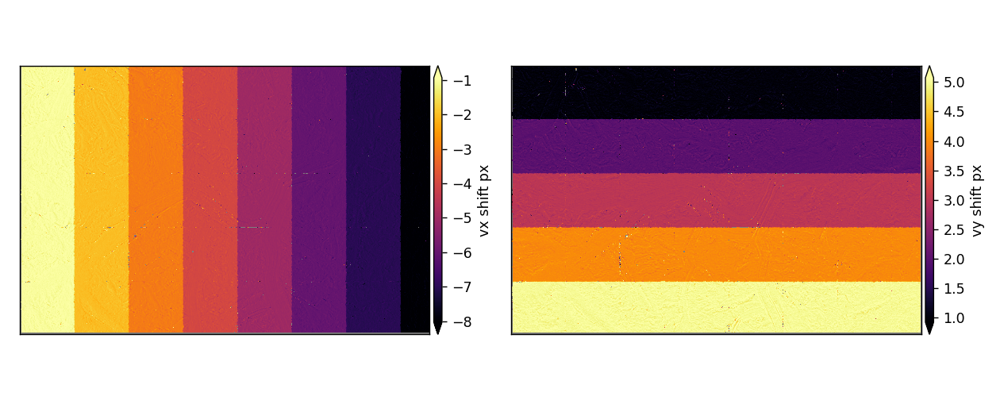

2021-04-13 14:18:33,587 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9afbb850>
2021-04-13 14:18:33,588 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9afbb850> on colorbar
2021-04-13 14:18:33,589 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:18:33,598 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9afbb850>
2021-04-13 14:18:33,598 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9afbb850> on colorbar
2021-04-13 14:18:33,599 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:18:34,091 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9b2f1f70>
2021-04-13 14:18:34,092 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocat

In [87]:
f,ax = plt.subplots(1,2,figsize=(1,4))
vx_solved,vy_solved = [iolib.fn_getma(spm1_refinement[-1],x) for x in [1,2]]
pltlib.iv(vx_solved,cmap='inferno',ax=ax[0],label='vx shift px')
pltlib.iv(vy_solved,cmap='inferno',ax=ax[1],label='vy shift px')
plt.tight_layout()

In [52]:
malib.get_stats_dict(vx_solved)

{'count': 8712663,
 'min': -10.940814971923828,
 'max': 3.5652694702148438,
 'ptp': 14.506084442138672,
 'mean': -4.282221873548765,
 'std': 2.1356544728001357,
 'nmad': 2.9537797880172727,
 'med': -4.008022785186768,
 'median': -4.008022785186768,
 'p16': -6.993836402893066,
 'p84': -1.9934555292129517,
 'spread': 2.5001904368400574,
 'mode': -6.0}

In [53]:
malib.get_stats_dict(vx_input)

{'count': 9222617,
 'min': 1.0,
 'max': 8.0,
 'ptp': 7.0,
 'mean': 4.296819763847941,
 'std': 2.1817703366801298,
 'nmad': 2.9652,
 'med': 4.0,
 'median': 4.0,
 'p16': 2.0,
 'p84': 7.0,
 'spread': 2.5,
 'mode': 7.0}

In [54]:
def box_plot_prep(synthetic_shift,computed_shift):
    unique_vals = np.unique(synthetic_shift)
    out_vals_list = []
    for vals in unique_vals:
        idx = synthetic_shift == vals
        out_vals_list.append(computed_shift[idx].compressed())
    return unique_vals.compressed(),out_vals_list[:-1]

In [55]:
box_plot_prep(vx_input,vx_solved)

(array([1., 2., 3., 4., 5., 6., 7., 8.]),
 [array([-1.0051681, -1.0076758, -1.0061294, ..., -1.3621454, -1.3833513,
         -1.4072453], dtype=float32),
  array([-1.7461216, -1.764442 , -1.7751962, ..., -1.982413 , -1.9869987,
         -1.9970585], dtype=float32),
  array([-2.2452781, -2.2645557, -2.2780812, ..., -3.0790799, -3.0919147,
         -3.0980222], dtype=float32),
  array([-3.6364064, -3.6673582, -3.6940687, ..., -4.0663114, -4.0712566,
         -4.0934386], dtype=float32),
  array([-4.4356065, -4.4873457, -4.538161 , ..., -4.984318 , -4.9854116,
         -4.9897103], dtype=float32),
  array([-5.3615766, -5.38612  , -5.392372 , ..., -5.9899607, -5.988075 ,
         -5.990871 ], dtype=float32),
  array([-6.589445 , -6.624551 , -6.647624 , ..., -7.178907 , -7.2010245,
         -7.224548 ], dtype=float32),
  array([-7.1323385, -7.1415563, -7.1475563, ..., -8.008154 , -8.016823 ,
         -8.021673 ], dtype=float32)])

In [56]:
len(box_x)

8

In [57]:
len(box_y)

8

<IPython.core.display.Javascript object>


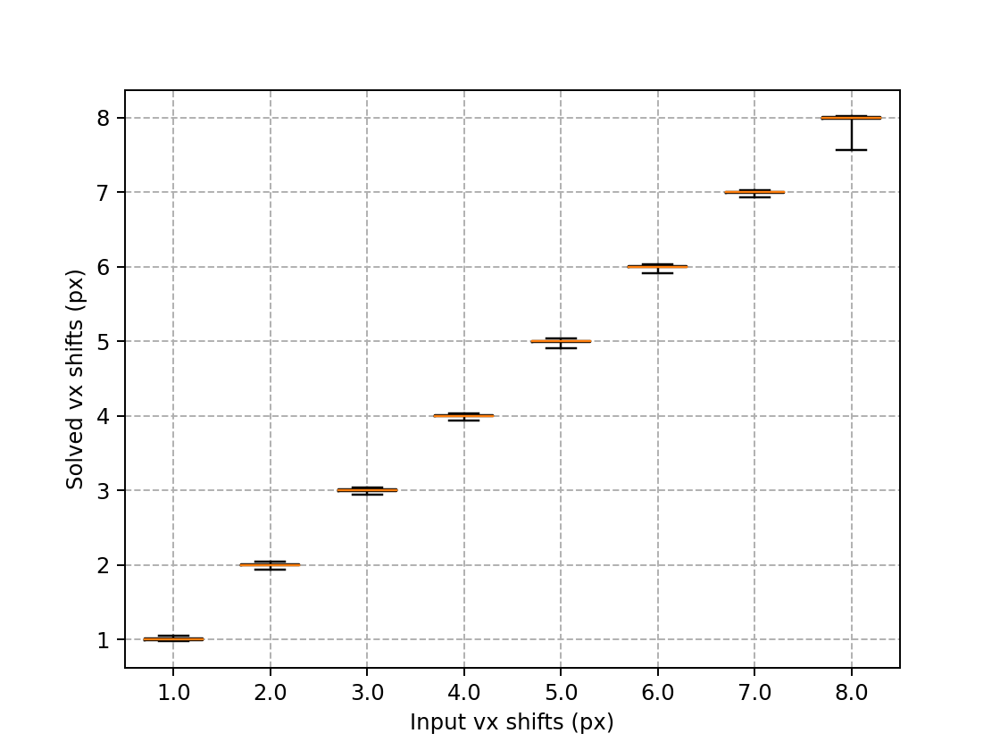

In [58]:
f,ax = plt.subplots()
vx_input = np.ma.array(iolib.fn_getma(vx_integer),mask=vx_solved.mask)
#ax.scatter(vx_input.compressed(),vx_solved.compressed(),s=1)
box_x,box_y = box_plot_prep(vx_input,-1*vx_solved)
ax.boxplot(box_y, positions=box_x, sym='', widths=0.6,whis=(5,95))
ax.set_xlabel('Input vx shifts (px)')
ax.set_ylabel('Solved vx shifts (px)')
ax.grid(linestyle='--')

In [71]:
%matplotlib notebook

2021-04-13 13:10:18,666 - matplotlib.pyplot - DEBUG - Loaded backend nbAgg version unknown.


<IPython.core.display.Javascript object>


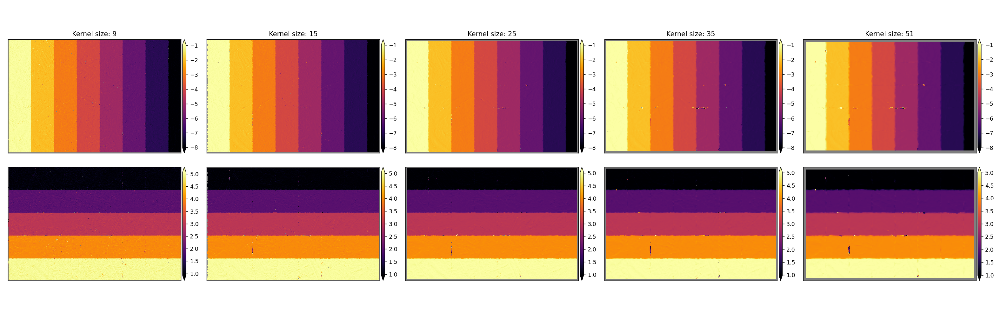

2021-04-13 13:10:24,524 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5aaa880>
2021-04-13 13:10:24,525 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5aaa880> on colorbar
2021-04-13 13:10:24,526 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 13:10:24,534 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5aaa880>
2021-04-13 13:10:24,535 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5aaa880> on colorbar
2021-04-13 13:10:24,536 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 13:10:25,134 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5951160>
2021-04-13 13:10:25,135 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocat

In [72]:
f,axa = plt.subplots(2,5,figsize=(25,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+5],cmap='inferno')
plt.tight_layout()

In [76]:
def plot_synthetic_boxplot(ax,v_input,v_output):
    v_input = np.ma.array(v_input,mask=v_output.mask)
    box_x,box_y = box_plot_prep(v_input,v_output)
    ax.boxplot(box_y, positions=box_x, sym='', widths=0.6,whis=(5,95))
    ax.grid(linestyle='--')


In [ ]:
ax.set_xlabel('Input vx shifts (px)')
ax.set_ylabel('Solved vx shifts (px)')


<IPython.core.display.Javascript object>


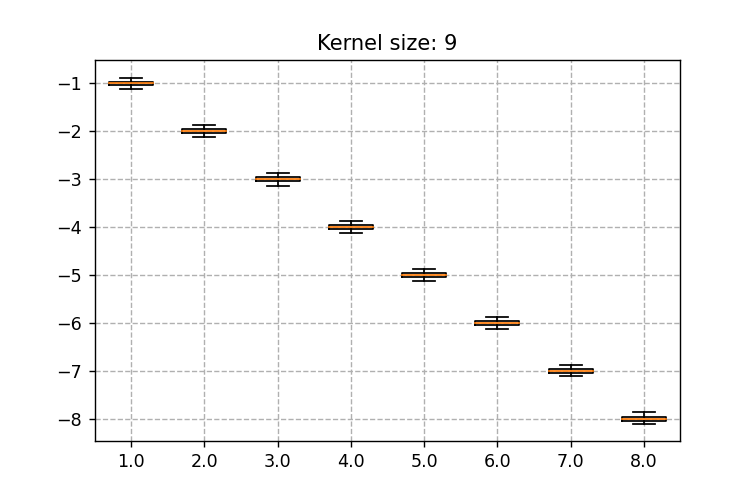

Text(0.5, 1.0, 'Kernel size: 9')

In [77]:
f,ax = plt.subplots()
plot_synthetic_boxplot(ax,vx_input,vx_list[0])
ax.set_title(f'Kernel size: {kernels[idx]}')

<IPython.core.display.Javascript object>


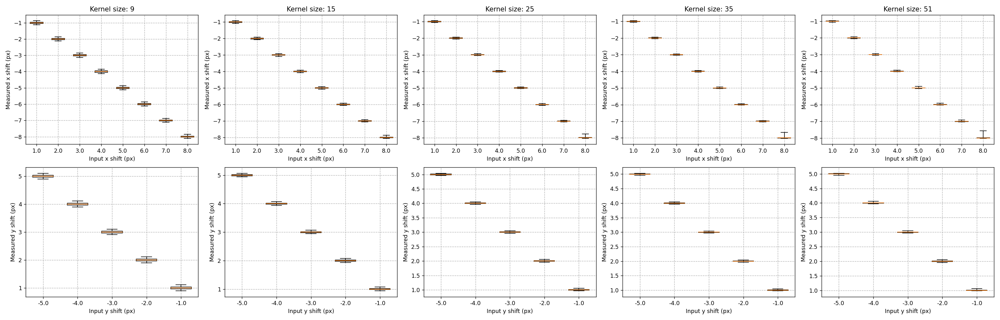

In [80]:
f,axa = plt.subplots(2,5,figsize=(25,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
# plot the x component first
vx_input = iolib.fn_getma(vx_integer)
vy_input = iolib.fn_getma(vy_integer)
vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_synthetic_boxplot(ax[idx],vx_input,vx)
    ax[idx].set_title(f'Kernel size: {kernels[idx]}')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_synthetic_boxplot(ax[idx+5],vy_input,vy)
    ax[idx+5].set_xlabel('Input y shift (px)')
    ax[idx+5].set_ylabel('Measured y shift (px)')
plt.tight_layout()

##### Fix kernel size change the spm mode 
###### Kernel size = 9

In [85]:
spm1_refinement[-1]

'./multipixel_shifts/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm1/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm1-F.tif'

In [81]:
kernel9_results = sorted(glob.glob('./multipixel_shifts/*multi_pixel_synthetic_shift*9px*spm*/*spm*-F.tif'))

In [82]:
kernel9_results

['./multipixel_shifts/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm1/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm1-F.tif',
 './multipixel_shifts/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm2-F.tif',
 './multipixel_shifts/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm3/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_vmap_minm_9px_spm3-F.tif']

<IPython.core.display.Javascript object>


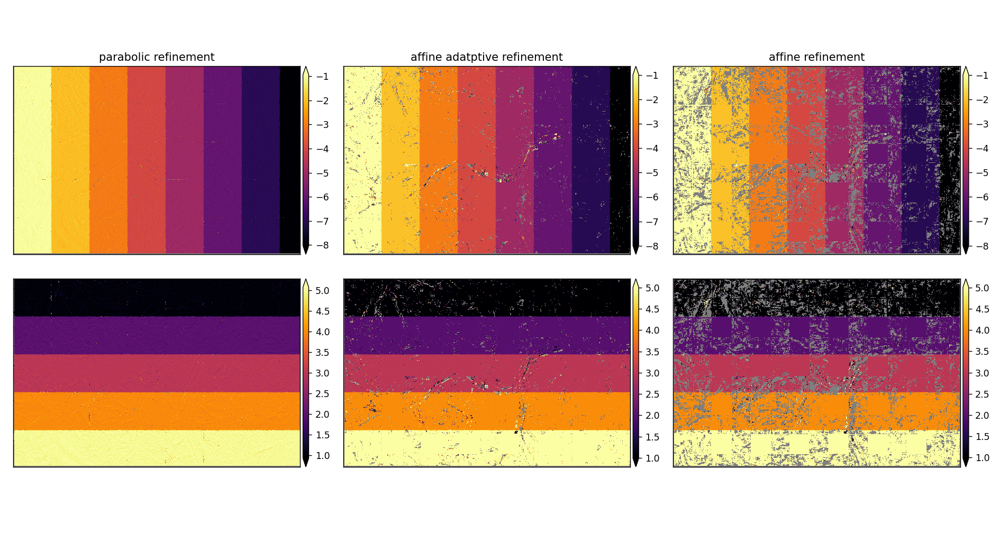

2021-04-13 14:21:33,833 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9cc19940>
2021-04-13 14:21:33,834 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9cc19940> on colorbar
2021-04-13 14:21:33,834 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:21:33,840 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9cc19940>
2021-04-13 14:21:33,841 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9cc19940> on colorbar
2021-04-13 14:21:33,842 - matplotlib.colorbar - DEBUG - Setting pcolormesh


/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


2021-04-13 14:21:34,282 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9b552640>
2021-04-13 14:21:34,283 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9b552640> on colorbar
2021-04-13 14:21:34,283 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:21:34,289 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9b552640>
2021-04-13 14:21:34,290 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9b552640> on colorbar
2021-04-13 14:21:34,291 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:21:34,784 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9b758ca0>
2021-04-13 14:21:34,785 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocat

In [91]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in kernel9_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='inferno',title=f'{refinement[idx]} refinement')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in kernel9_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+3],cmap='inferno')
plt.tight_layout()

window sizes for affine adaptive and adaptive windows should be higher.

<IPython.core.display.Javascript object>


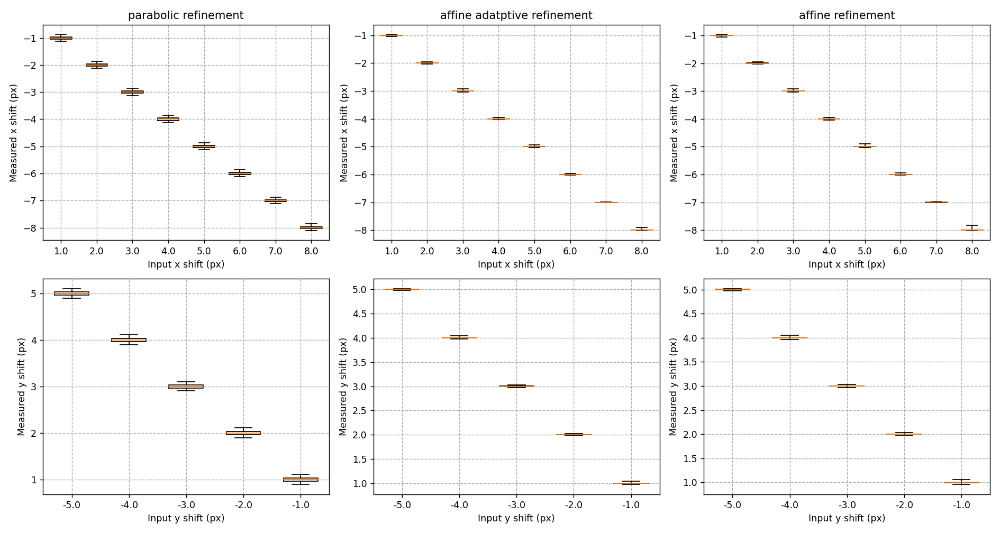

In [95]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first
vx_input = iolib.fn_getma(vx_integer)
vy_input = iolib.fn_getma(vy_integer)
vx_list = [iolib.fn_getma(x,1) for x in kernel9_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_synthetic_boxplot(ax[idx],vx_input,vx)
    ax[idx].set_title(f'{refinement[idx]} refinement')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

vy_list = [iolib.fn_getma(x,2) for x in kernel9_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_synthetic_boxplot(ax[idx+3],vy_input,vy)
    ax[idx+3].set_xlabel('Input y shift (px)')
    ax[idx+3].set_ylabel('Measured y shift (px)')
plt.tight_layout()

##### Fix kernel size change the spm mode 
###### Kernel size = 35

In [104]:
kernel35_results = sorted(glob.glob('./multipixel_shifts/*multi_pixel_synthetic_shift*35px*spm*/*spm*-F.tif'))

<IPython.core.display.Javascript object>


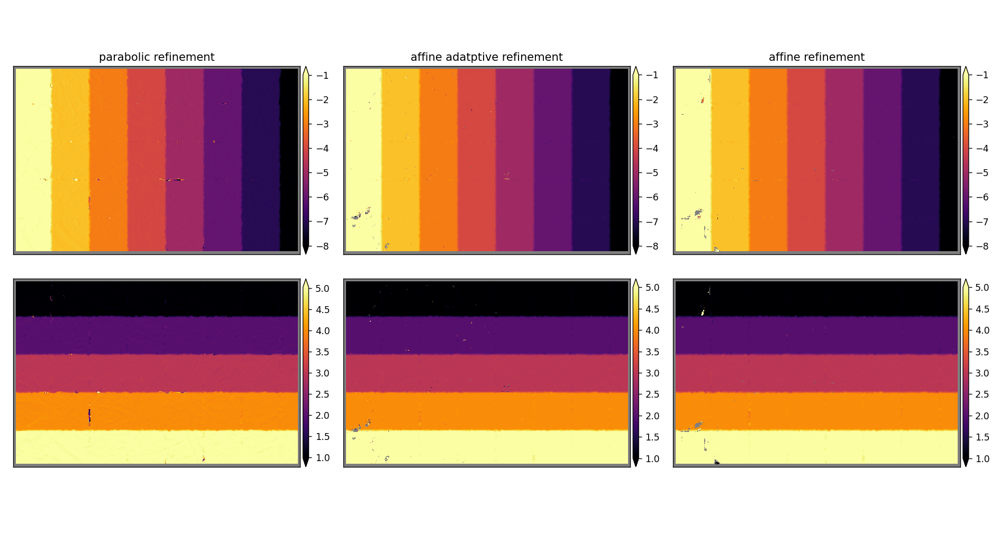

2021-04-13 14:37:17,042 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68134c0>
2021-04-13 14:37:17,043 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68134c0> on colorbar
2021-04-13 14:37:17,044 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:37:17,050 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68134c0>
2021-04-13 14:37:17,051 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68134c0> on colorbar
2021-04-13 14:37:17,051 - matplotlib.colorbar - DEBUG - Setting pcolormesh


/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


2021-04-13 14:37:17,457 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68974c0>
2021-04-13 14:37:17,458 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68974c0> on colorbar
2021-04-13 14:37:17,459 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:37:17,466 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68974c0>
2021-04-13 14:37:17,467 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68974c0> on colorbar
2021-04-13 14:37:17,468 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 14:37:17,718 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca68dcf40>
2021-04-13 14:37:17,719 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocat

In [106]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in kernel35_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='inferno',title=f'{refinement[idx]} refinement')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in kernel35_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+3],cmap='inferno')
plt.tight_layout()

<IPython.core.display.Javascript object>


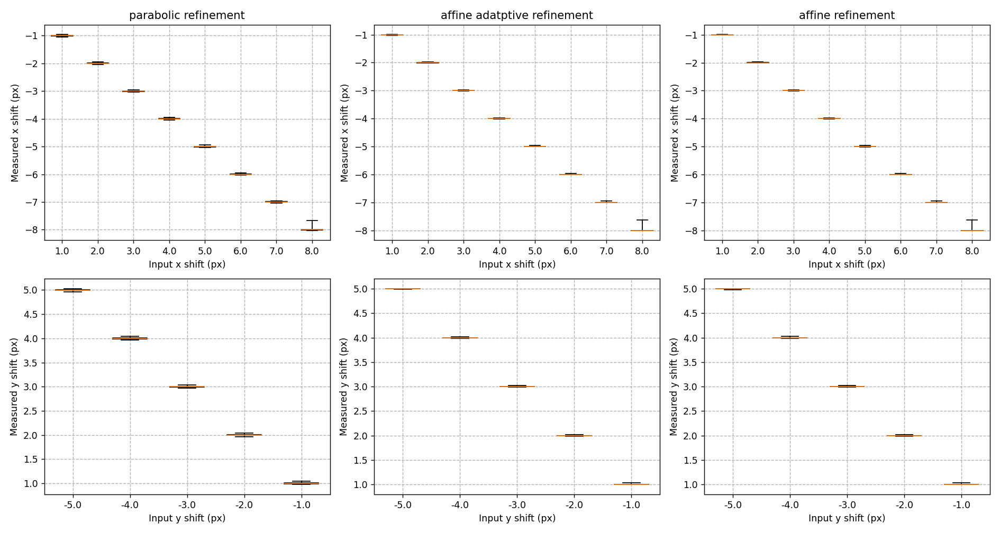

In [107]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first
vx_input = iolib.fn_getma(vx_integer)
vy_input = iolib.fn_getma(vy_integer)
vx_list = [iolib.fn_getma(x,1) for x in kernel35_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_synthetic_boxplot(ax[idx],vx_input,vx)
    ax[idx].set_title(f'{refinement[idx]} refinement')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

vy_list = [iolib.fn_getma(x,2) for x in kernel35_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_synthetic_boxplot(ax[idx+3],vy_input,vy)
    ax[idx+3].set_xlabel('Input y shift (px)')
    ax[idx+3].set_ylabel('Measured y shift (px)')
plt.tight_layout()

##### Fix kernel size change the spm mode 
###### Kernel size = 15

In [109]:
kernel15_results = sorted(glob.glob('./multipixel_shifts/*multi_pixel_synthetic_shift*15px*spm*/*spm*-F.tif'))

<IPython.core.display.Javascript object>


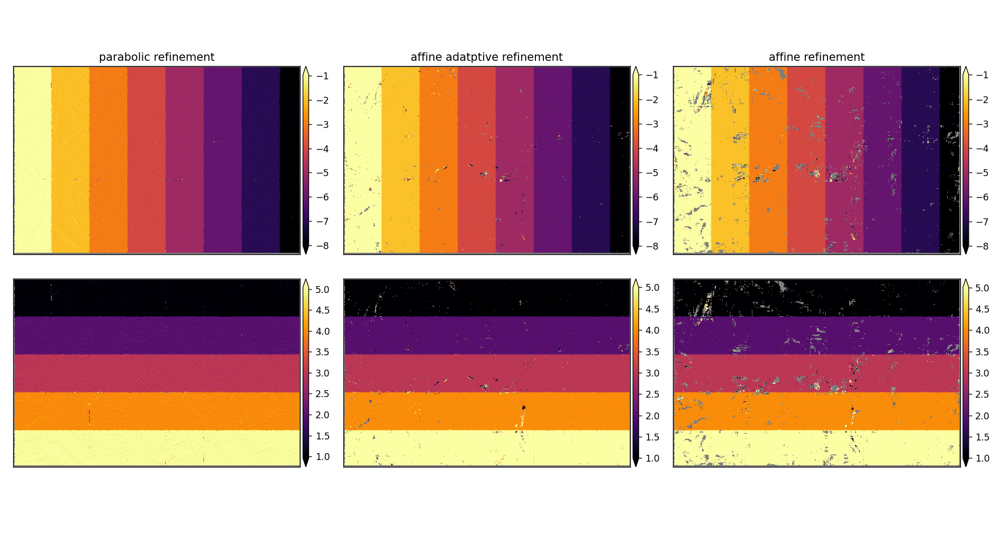

2021-04-13 15:53:18,007 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9deeb9a0>
2021-04-13 15:53:18,030 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9deeb9a0> on colorbar
2021-04-13 15:53:18,031 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 15:53:18,043 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9deeb9a0>
2021-04-13 15:53:18,044 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9deeb9a0> on colorbar
2021-04-13 15:53:18,045 - matplotlib.colorbar - DEBUG - Setting pcolormesh


/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


2021-04-13 15:53:19,523 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9c08c5b0>
2021-04-13 15:53:19,524 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9c08c5b0> on colorbar
2021-04-13 15:53:19,525 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 15:53:19,533 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9c08c5b0>
2021-04-13 15:53:19,534 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9c08c5b0> on colorbar
2021-04-13 15:53:19,535 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 15:53:19,881 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aac9d174850>
2021-04-13 15:53:19,882 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocat

In [110]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in kernel15_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='inferno',title=f'{refinement[idx]} refinement')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in kernel15_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+3],cmap='inferno')
plt.tight_layout()

<IPython.core.display.Javascript object>


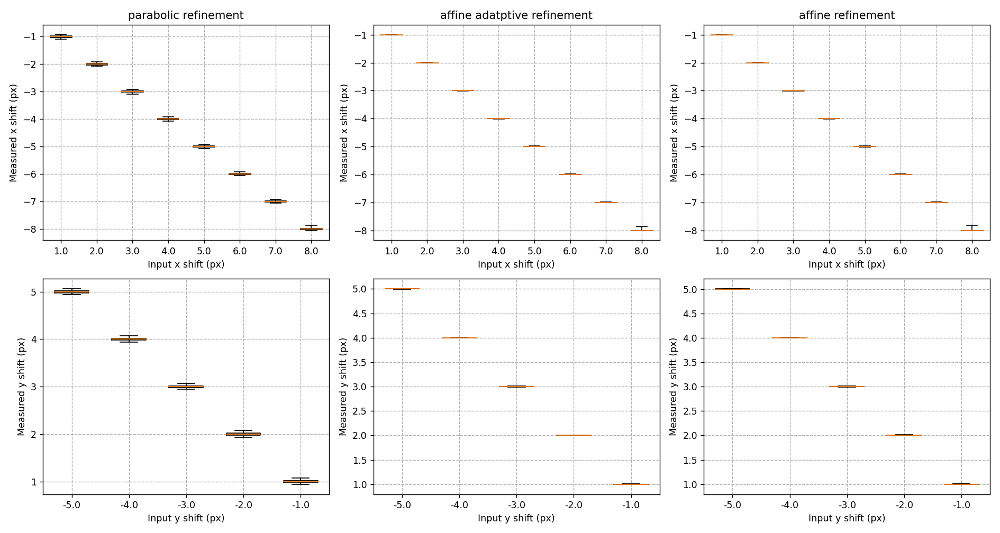

In [111]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first
vx_input = iolib.fn_getma(vx_integer)
vy_input = iolib.fn_getma(vy_integer)
vx_list = [iolib.fn_getma(x,1) for x in kernel15_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_synthetic_boxplot(ax[idx],vx_input,vx)
    ax[idx].set_title(f'{refinement[idx]} refinement')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

vy_list = [iolib.fn_getma(x,2) for x in kernel15_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_synthetic_boxplot(ax[idx+3],vy_input,vy)
    ax[idx+3].set_xlabel('Input y shift (px)')
    ax[idx+3].set_ylabel('Measured y shift (px)')
plt.tight_layout()

#### Spread in the observed values is lower in affine adaptive and affine measurements when compared to parabolic subpixel shifts, but might have some blunders.

##### Results with kernel size of 51 px

In [112]:
kernel51_results = sorted(glob.glob('./multipixel_shifts/*multi_pixel_synthetic_shift*51px*spm*/*spm*-F.tif'))

<IPython.core.display.Javascript object>


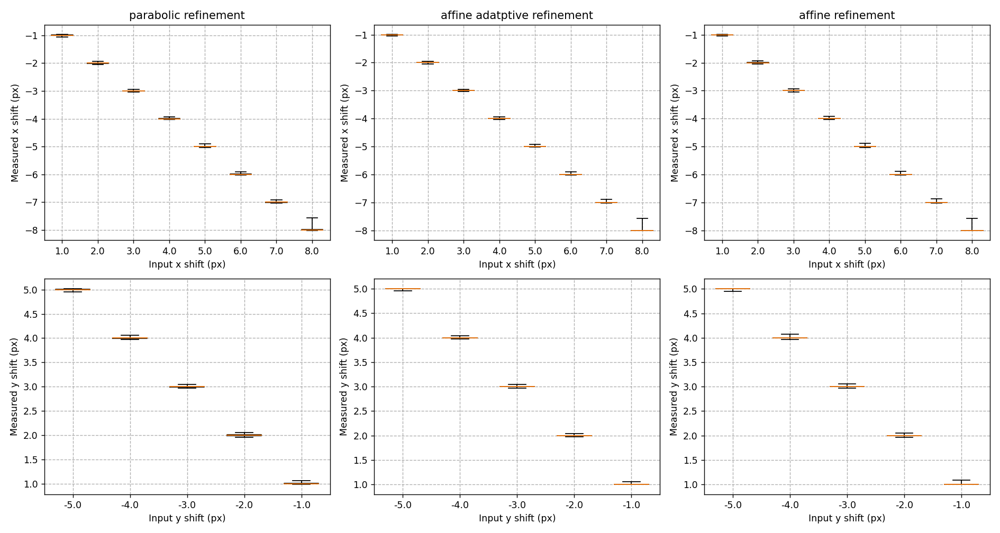

In [113]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first
vx_input = iolib.fn_getma(vx_integer)
vy_input = iolib.fn_getma(vy_integer)
vx_list = [iolib.fn_getma(x,1) for x in kernel51_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_synthetic_boxplot(ax[idx],vx_input,vx)
    ax[idx].set_title(f'{refinement[idx]} refinement')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

vy_list = [iolib.fn_getma(x,2) for x in kernel51_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_synthetic_boxplot(ax[idx+3],vy_input,vy)
    ax[idx+3].set_xlabel('Input y shift (px)')
    ax[idx+3].set_ylabel('Measured y shift (px)')
plt.tight_layout()

<IPython.core.display.Javascript object>


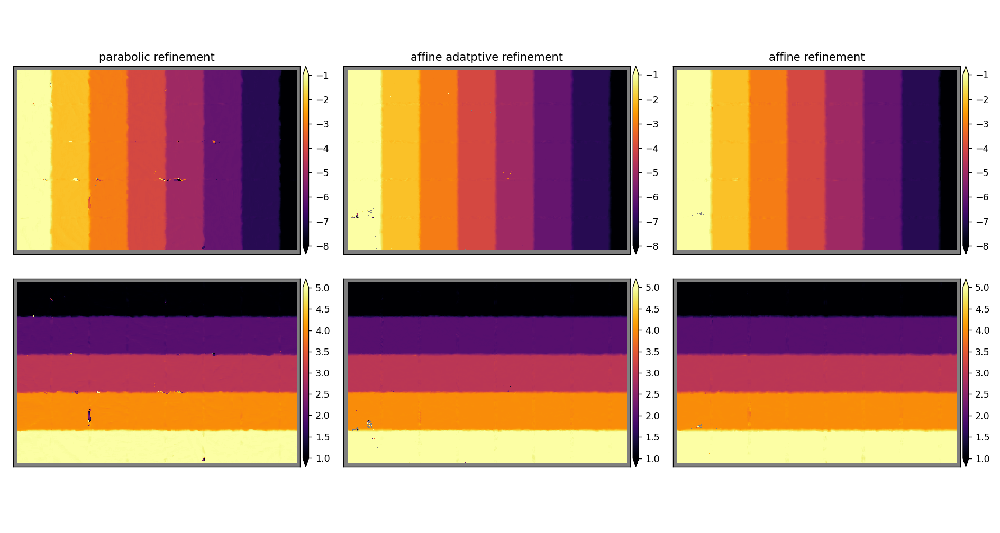

2021-04-13 15:55:45,096 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5fc2ac0>
2021-04-13 15:55:45,097 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5fc2ac0> on colorbar
2021-04-13 15:55:45,098 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 15:55:45,103 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5fc2ac0>
2021-04-13 15:55:45,104 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca5fc2ac0> on colorbar
2021-04-13 15:55:45,105 - matplotlib.colorbar - DEBUG - Setting pcolormesh


/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


2021-04-13 15:55:45,637 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca6086190>
2021-04-13 15:55:45,639 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca6086190> on colorbar
2021-04-13 15:55:45,639 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 15:55:45,645 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca6086190>
2021-04-13 15:55:45,646 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca6086190> on colorbar
2021-04-13 15:55:45,647 - matplotlib.colorbar - DEBUG - Setting pcolormesh
2021-04-13 15:55:46,109 - matplotlib.colorbar - DEBUG - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x2aaca6146df0>
2021-04-13 15:55:46,111 - matplotlib.colorbar - DEBUG - Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocat

In [114]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in kernel51_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='inferno',title=f'{refinement[idx]} refinement')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in kernel51_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+3],cmap='inferno')
plt.tight_layout()

### Measurements with deformation shifts

In [8]:
vx_deformation = 'vx_deformation.tif'
vy_deformation = 'vy_deformation.tif'
spm1_refinement = sorted(glob.glob('./multipixel_shifts/*deformation_synthetic_shift*spm1/*spm1*-F.tif'))

<IPython.core.display.Javascript object>


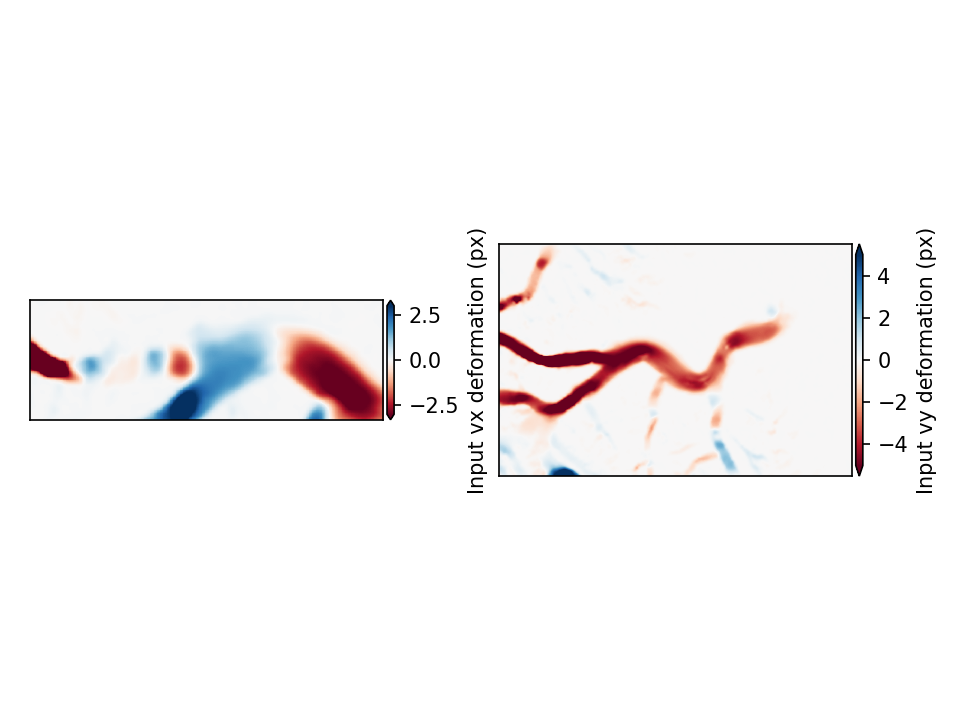

/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [6]:
f,ax = plt.subplots(1,2)
pltlib.iv_fn(vx_deformation,ax=ax[0],label='Input vx deformation (px)',
             scalebar=False,cmap='RdBu',clim=(-3,3))
pltlib.iv_fn(vy_deformation,ax=ax[1],label='Input vy deformation (px)',
             scalebar=False,cmap='RdBu',clim=(-5,5))

In [123]:
vx_solved.count()

9132687

In [122]:
vx_input.count()

9132683

In [4]:
def plot_scatter(ax,v_input,v_output):
    mask = malib.common_mask([v_input,v_output])
    v_input = np.ma.array(v_input,mask=mask)
    v_output = -1*np.ma.array(v_output,mask=mask)
    ax.scatter(v_input.compressed(),v_output.compressed(),s=1,c='r')
    #ax.hist2d(v_input.compressed(),v_output.compressed(),bins=50,cmap='inferno')
    # median absolute difference formula from here: https://en.wikipedia.org/wiki/Mean_absolute_difference
    # I changed the n2 to n, where n is the number of observations
    mad = np.round(np.sum(np.abs(v_input.compressed()-v_output.compressed()))/(v_input.count()),2)
    
    ax.text(x=0.75,y=0.9,
            s=f'CORR = {np.round(np.corrcoef(v_input.compressed(),v_output.compressed())[0,1],3)}\n MAD = {mad}',transform=ax.transAxes)
    ax.grid(linestyle='--')

<IPython.core.display.Javascript object>


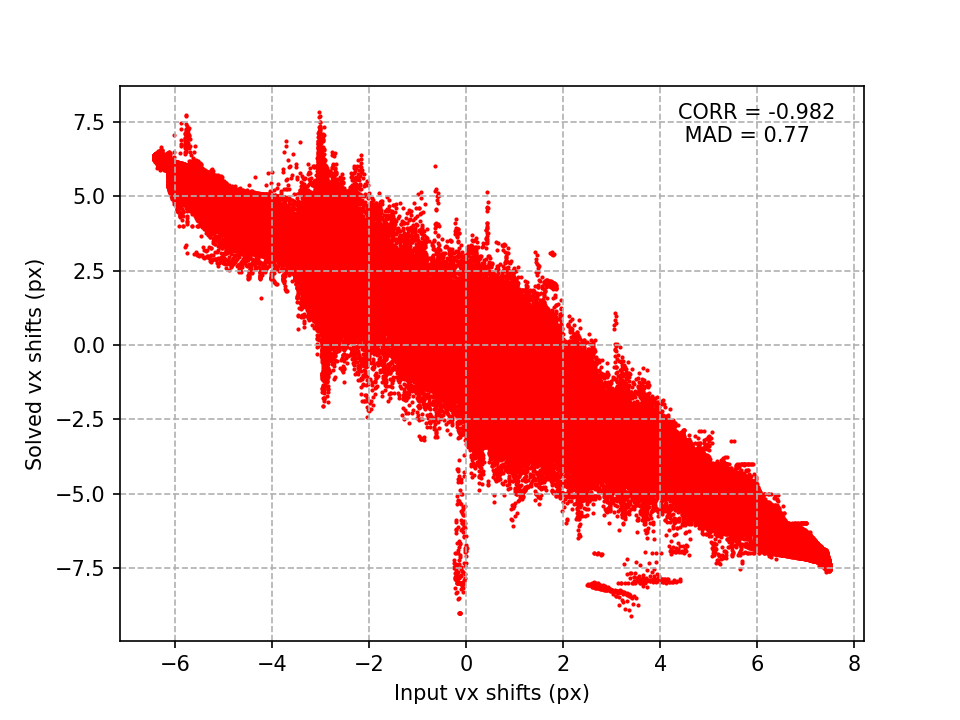

Text(0, 0.5, 'Solved vx shifts (px)')

In [24]:
f,ax = plt.subplots()
vx_solved = iolib.fn_getma(spm1_refinement[0],1)

vx_input = iolib.fn_getma(vx_deformation)

mask = malib.common_mask([vx_input,vx_solved])
vx_input = np.ma.array(vx_input,mask=mask)
vx_solved = np.ma.array(vx_solved,mask=mask)
plot_scatter(ax,vx_input,vx_solved)
#ax.scatter(vx_input.compressed(),vx_solved.compressed(),s=1,c='r')
#ax.text(x=6,y=7.5,s=f'r = {np.round(np.corrcoef(vx_input.compressed(),vx_solved.compressed())[0,1],3)}')
#box_x,box_y = box_plot_prep(vx_input,-1*vx_solved)
#ax.boxplot(box_y, positions=box_x, sym='', widths=0.6,whis=(5,95))
ax.set_xlabel('Input vx shifts (px)')
ax.set_ylabel('Solved vx shifts (px)')


<IPython.core.display.Javascript object>


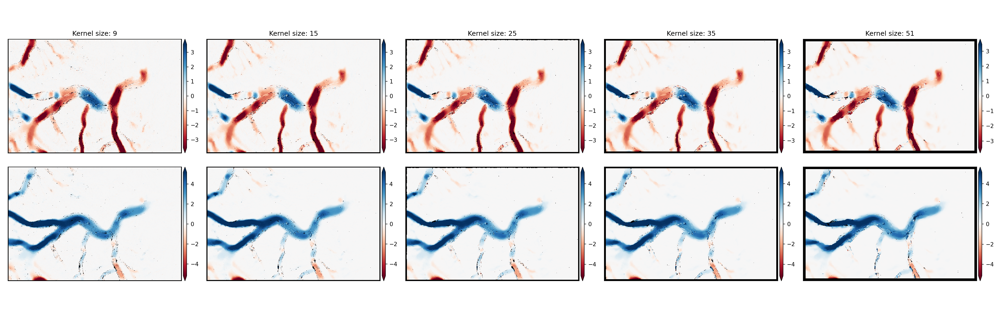

In [9]:
f,axa = plt.subplots(2,5,figsize=(25,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
              title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+5],cmap='RdBu',clim=malib.calcperc_sym(vy,perc=(2,98)))
plt.tight_layout()

<IPython.core.display.Javascript object>


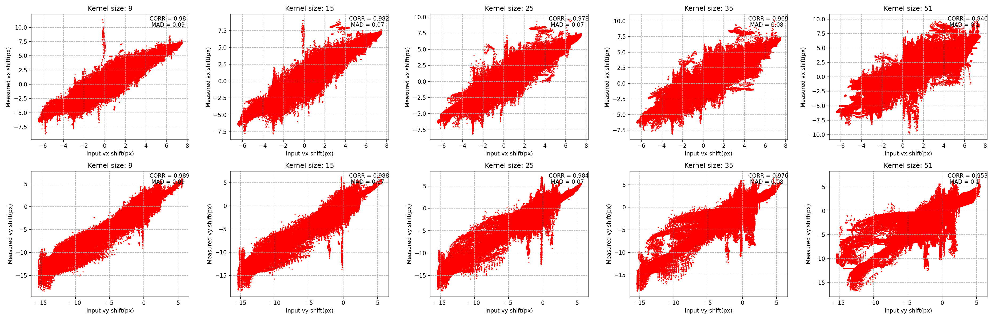

In [32]:
f,axa = plt.subplots(2,5,figsize=(25,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    vx_in = iolib.fn_getma(vx_deformation)
    plot_scatter(ax[idx],vx_in,vx)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_title(f'Kernel size: {kernels[idx]}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    #pltlib.iv(vy,ax=ax[idx+5],cmap='RdBu',clim=malib.calcperc_sym(vy,perc=(2,98)))
    vy_in = iolib.fn_getma(vy_deformation)
    plot_scatter(ax[idx+5],vy_in,vy)
    ax[idx+5].set_xlabel('Input vy shift(px)')
    ax[idx+5].set_ylabel('Measured vy shift(px)')
    ax[idx+5].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

### spm 2

In [27]:
vx_deformation = 'vx_deformation.tif'
vy_deformation = 'vy_deformation.tif'
spm2_refinement = sorted(glob.glob('./multipixel_shifts/*deformation_synthetic_shift*spm2/*spm2*-F.tif'))

<IPython.core.display.Javascript object>


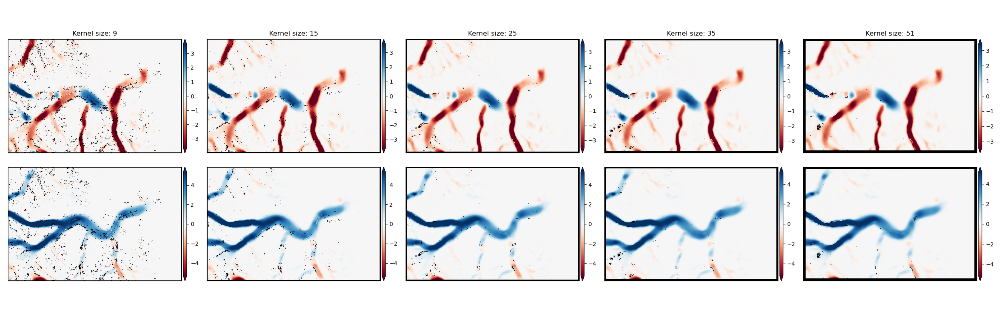

In [11]:
f,axa = plt.subplots(2,5,figsize=(25,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in spm2_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
              title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in spm2_refinement]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+5],cmap='RdBu',clim=malib.calcperc_sym(vy,perc=(2,98)))
plt.tight_layout()

<IPython.core.display.Javascript object>


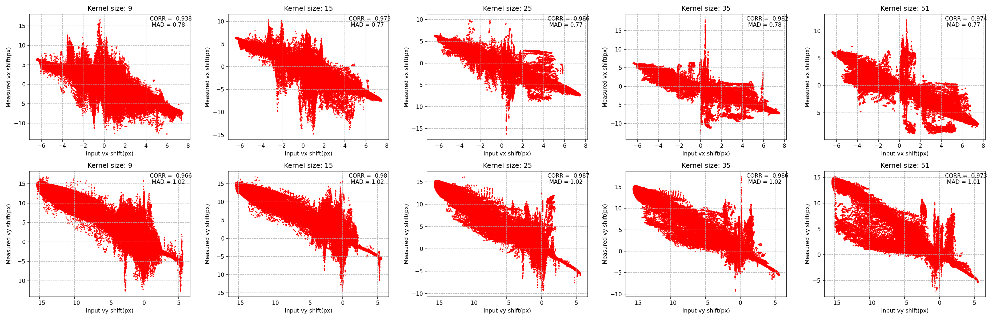

In [28]:
f,axa = plt.subplots(2,5,figsize=(25,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in spm2_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    vx_in = iolib.fn_getma(vx_deformation)
    plot_scatter(ax[idx],vx_in,vx)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_title(f'Kernel size: {kernels[idx]}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in spm2_refinement]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    #pltlib.iv(vy,ax=ax[idx+5],cmap='RdBu',clim=malib.calcperc_sym(vy,perc=(2,98)))
    vy_in = iolib.fn_getma(vy_deformation)
    plot_scatter(ax[idx+5],vy_in,vy)
    ax[idx+5].set_xlabel('Input vy shift(px)')
    ax[idx+5].set_ylabel('Measured vy shift(px)')
    ax[idx+5].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

### spm3

In [10]:
vx_deformation = 'vx_deformation.tif'
vy_deformation = 'vy_deformation.tif'
spm3_refinement = sorted(glob.glob('./multipixel_shifts/*deformation_synthetic_shift*spm3/*spm3*-F.tif'))

<IPython.core.display.Javascript object>


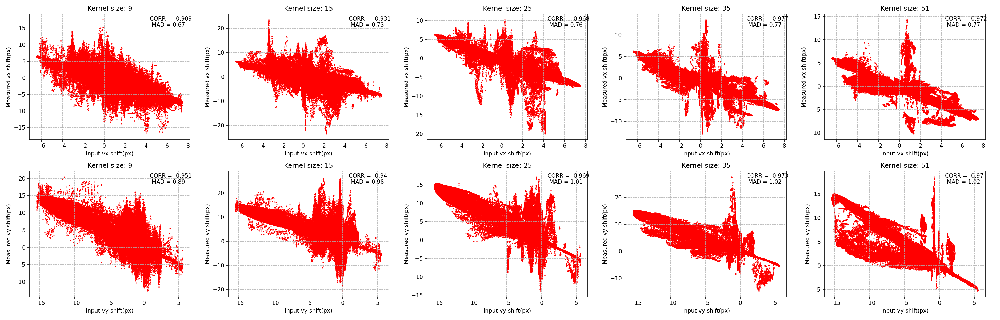

In [29]:
f,axa = plt.subplots(2,5,figsize=(25,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
# plot the x component first

vx_list = [iolib.fn_getma(x,1) for x in spm3_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    vx_in = iolib.fn_getma(vx_deformation)
    plot_scatter(ax[idx],vx_in,vx)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_title(f'Kernel size: {kernels[idx]}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in spm3_refinement]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    #pltlib.iv(vy,ax=ax[idx+5],cmap='RdBu',clim=malib.calcperc_sym(vy,perc=(2,98)))
    vy_in = iolib.fn_getma(vy_deformation)
    plot_scatter(ax[idx+5],vy_in,vy)
    ax[idx+5].set_xlabel('Input vy shift(px)')
    ax[idx+5].set_ylabel('Measured vy shift(px)')
    ax[idx+5].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

#### For affine adaptive and affine refinement method, small kernel sizes produce the most offset, but get bets result with medium to big kernel sizes.

#### Fix kernel size change the spm mode
##### Kernel size = 35

In [4]:
kernel35_results = sorted(glob.glob('./multipixel_shifts/*deformation_synthetic_shift*35px*spm*/*spm*-F.tif'))

<IPython.core.display.Javascript object>


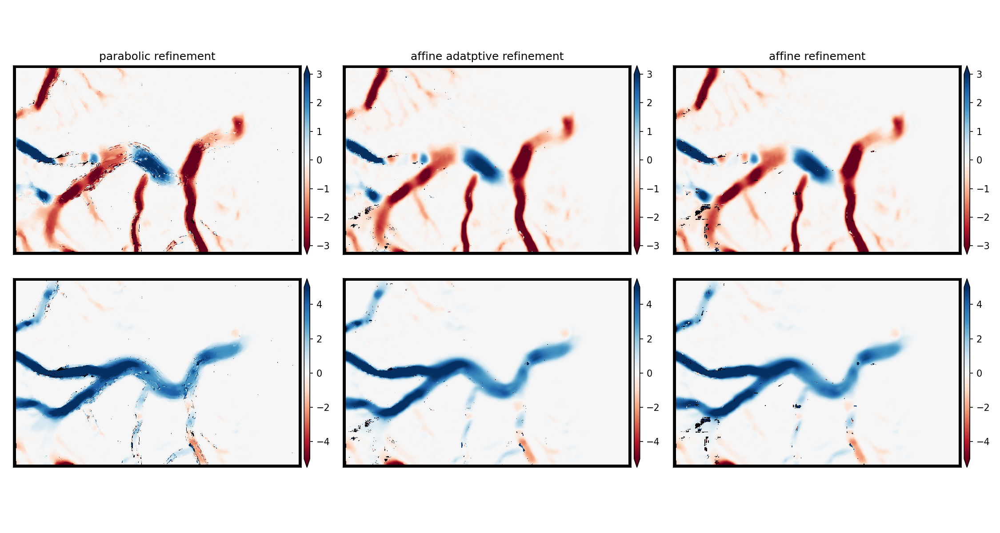

In [15]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first

clim_x = (-3,3)
clim_y = (-5,5)
vx_list = [iolib.fn_getma(x,1) for x in kernel35_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='RdBu',title=f'{refinement[idx]} refinement',
             clim=clim_x)

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in kernel35_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+3],cmap='RdBu',clim=clim_y)
plt.tight_layout()

<IPython.core.display.Javascript object>


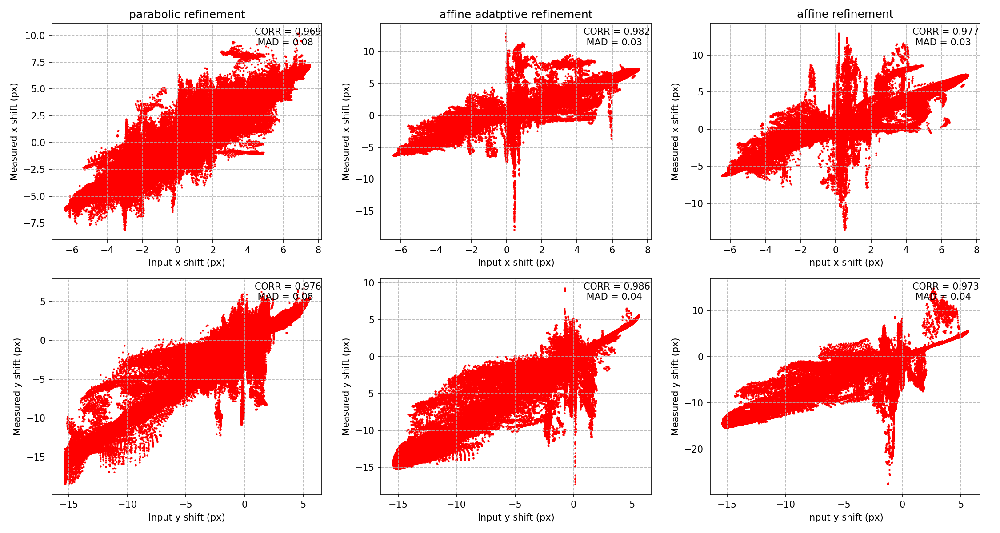

In [10]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first
vx_input = iolib.fn_getma(vx_deformation)
vy_input = iolib.fn_getma(vy_deformation)
vx_list = [iolib.fn_getma(x,1) for x in kernel35_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_scatter(ax[idx],vx_input,vx)
    ax[idx].set_title(f'{refinement[idx]} refinement')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

vy_list = [iolib.fn_getma(x,2) for x in kernel35_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_scatter(ax[idx+3],vy_input,vy)
    #plot_synthetic_boxplot(ax[idx+3],vy_input,vy)
    ax[idx+3].set_xlabel('Input y shift (px)')
    ax[idx+3].set_ylabel('Measured y shift (px)')
plt.tight_layout()

#### Kernel size of 51 px

In [5]:
kernel51_results = sorted(glob.glob('./multipixel_shifts/*deformation_synthetic_shift*51px*spm*/*spm*-F.tif'))

<IPython.core.display.Javascript object>


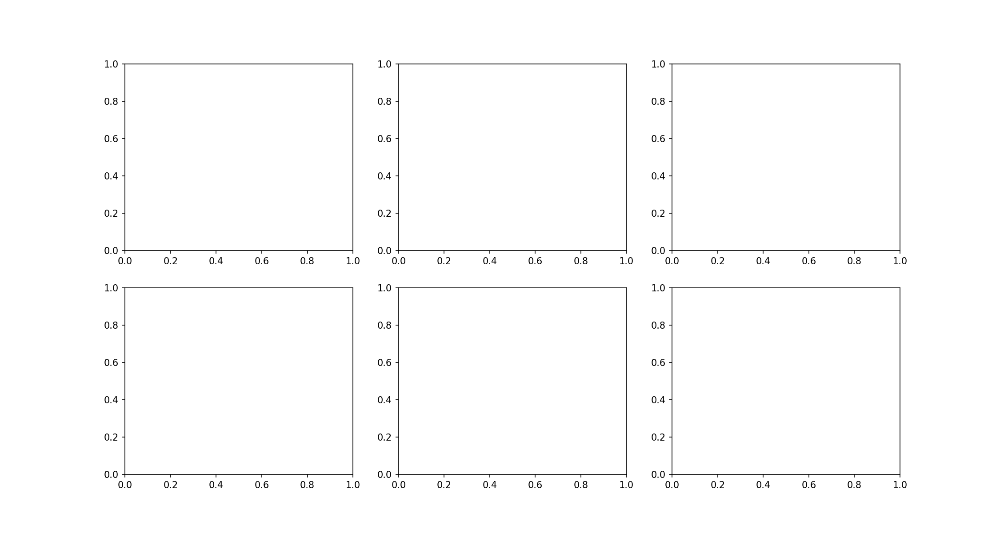

NameError: name 'kernel9_results' is not defined

In [7]:
f,axa = plt.subplots(2,3,figsize=(15,8))
ax = axa.ravel()
kernels = [9,15,25,35,51]
refinement = ['parabolic','affine adatptive','affine']
# plot the x component first

clim_x = (-3,3)
clim_y = (-5,5)
vx_list = [iolib.fn_getma(x,1) for x in kernel9_results]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(vx,ax=ax[idx],cmap='RdBu',title=f'{refinement[idx]} refinement',
             clim=clim_x)

# now plot the y component first

vy_list = [iolib.fn_getma(x,2) for x in kernel9_results]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(vy,ax=ax[idx+3],cmap='RdBu',clim=clim_y)
plt.tight_layout()